Frame 1: Detected 83 people.


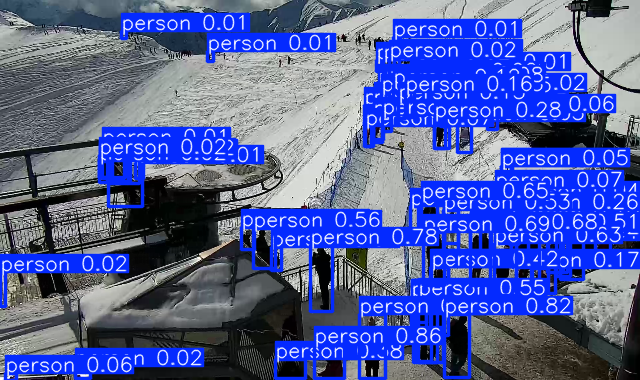

Frame 2: Detected 68 people.


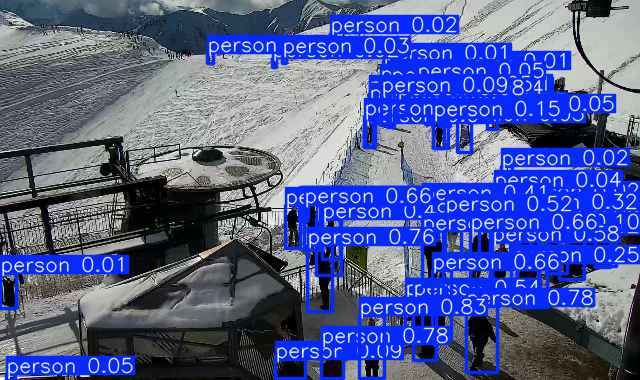

Frame 3: Detected 75 people.


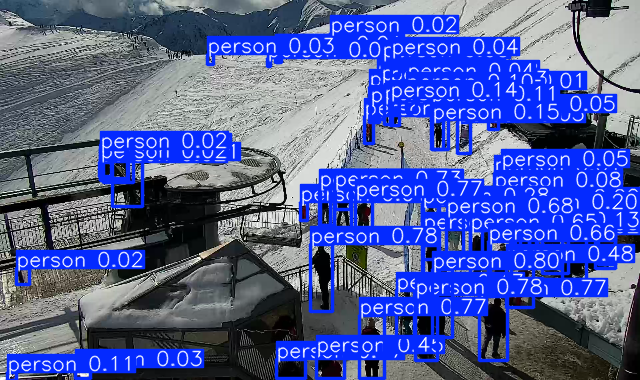

Frame 4: Detected 79 people.


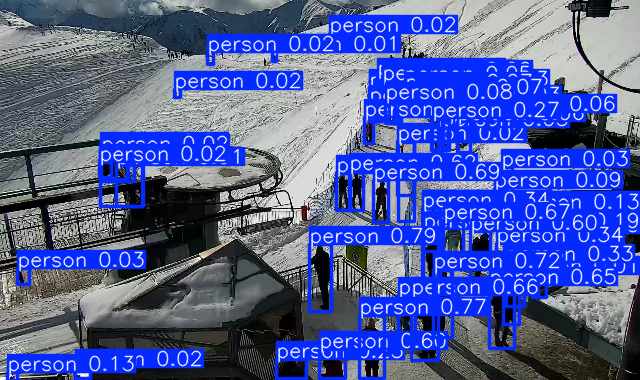

Frame 5: Detected 92 people.


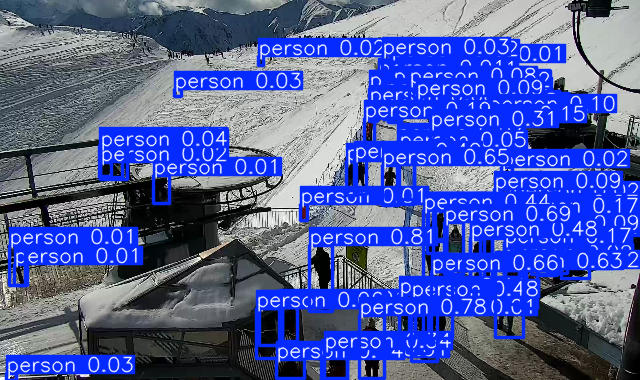

Frame 6: Detected 89 people.


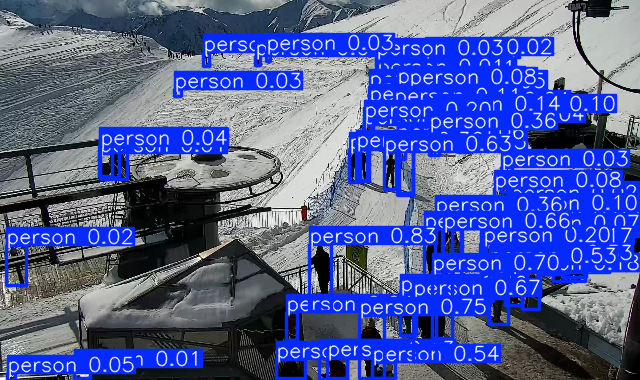

Frame 7: Detected 81 people.


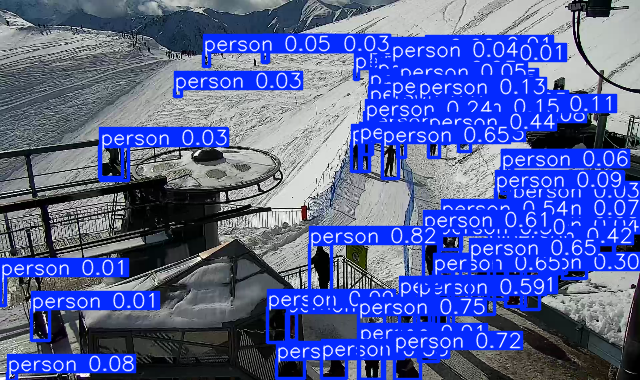

Frame 8: Detected 103 people.


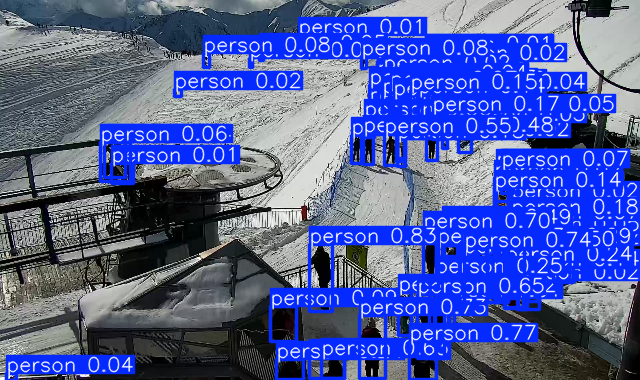

Frame 9: Detected 100 people.


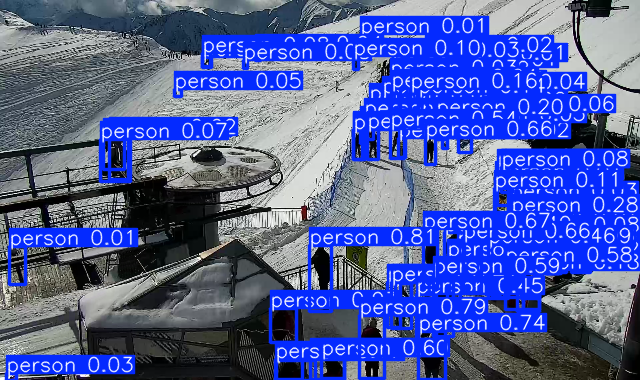

Frame 10: Detected 112 people.


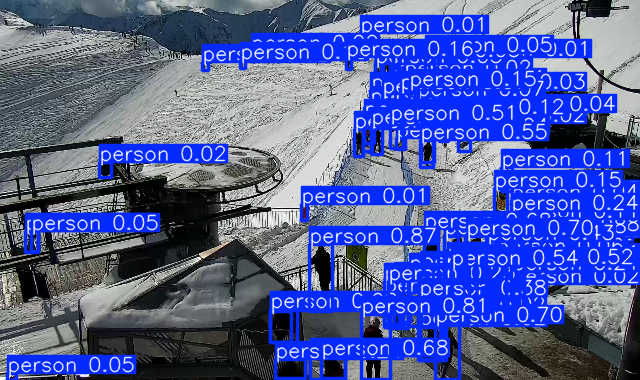

Frame 11: Detected 102 people.


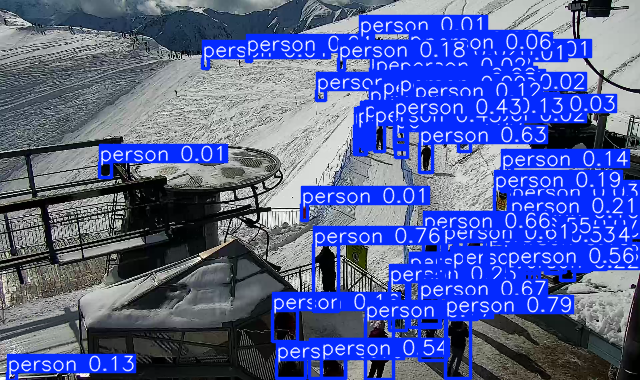

Frame 12: Detected 106 people.


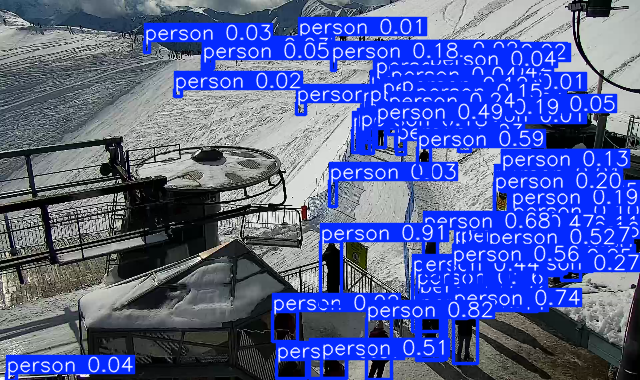

Frame 13: Detected 86 people.


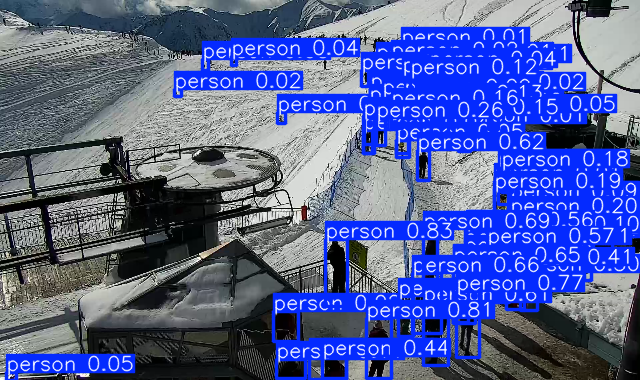

Frame 14: Detected 98 people.


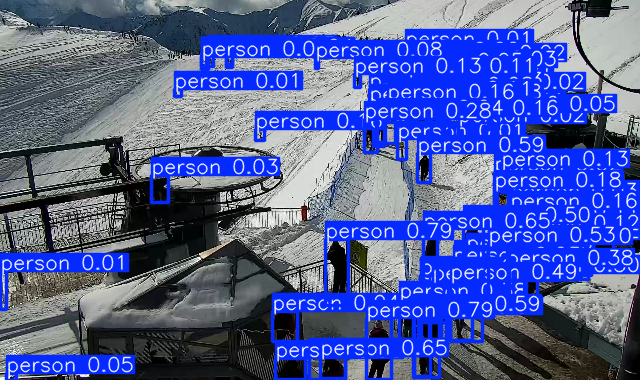

Frame 15: Detected 94 people.


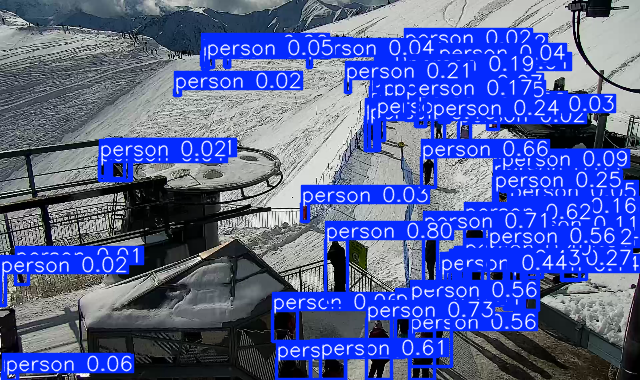

Frame 16: Detected 79 people.


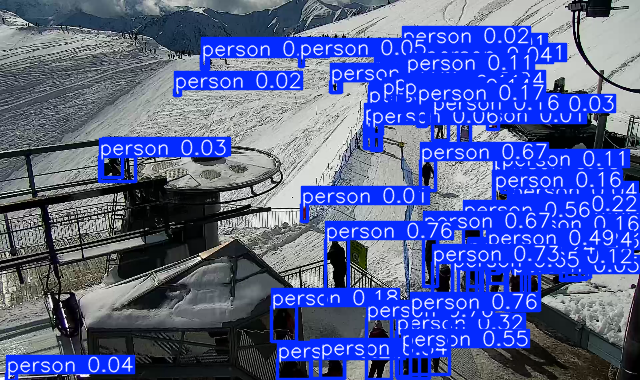

Frame 17: Detected 78 people.


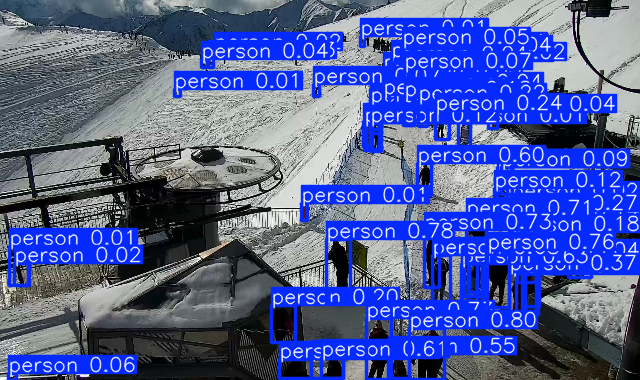

Frame 18: Detected 83 people.


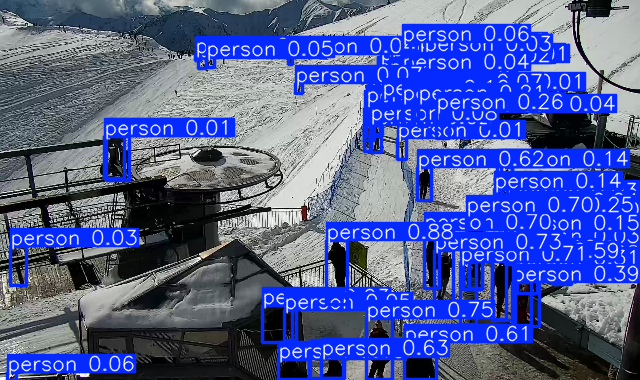

Frame 19: Detected 72 people.


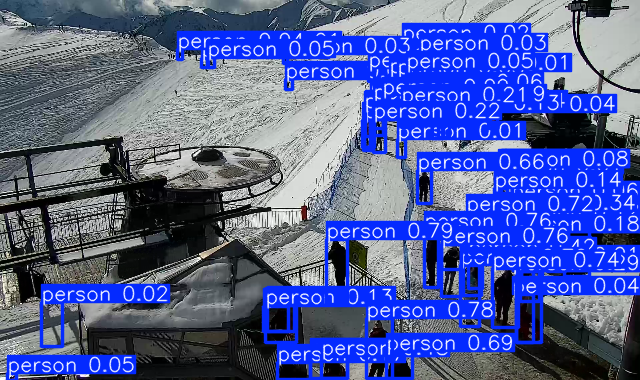

Frame 20: Detected 59 people.


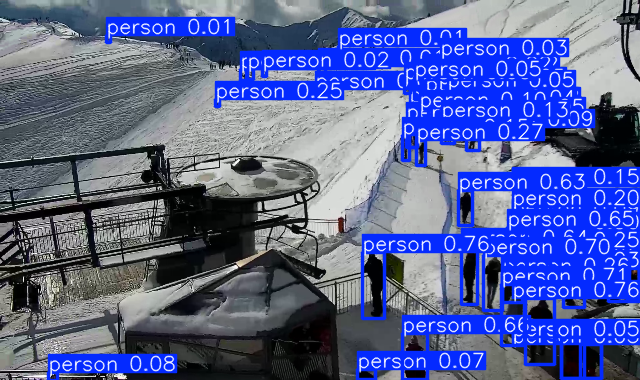

Stream processing finished.


In [ ]:
import cv2
from ultralytics import YOLO
import numpy as np
import time
from IPython.display import display
from PIL import Image

class PeopleCounter:
    def __init__(self, stream_url, max_frames=20, frame_skip=20):
        self.stream_url = stream_url
        self.model = YOLO('yolov8l.pt')  # YOLOv8 model
        self.cap = cv2.VideoCapture(stream_url)
        self.class_ids = [0]  # 0 = 'person' in COCO dataset
        self.confidence_threshold = 0.01
        self.max_frames = max_frames
        self.frame_skip = frame_skip

        self.cap.set(cv2.CAP_PROP_BUFFERSIZE, 1)

    def process_stream(self):
        if not self.cap.isOpened():
            print("Error: Could not open video stream")
            return

        frame_count = 0

        try:
            while frame_count < self.max_frames:
                for _ in range(self.frame_skip - 1):
                    self.cap.grab()

                ret, frame = self.cap.read()
                if not ret:
                    print("Error: Failed to capture frame")
                    break

                ret, frame = self.cap.read()
                if not ret:
                    print("Error: Failed to capture frame")
                    break

                frame_resized = cv2.resize(frame, (640, 380)) 

                results = self.model.predict(
                    source=frame_resized,  
                    classes=self.class_ids,
                    conf=self.confidence_threshold,
                    verbose=False
                    )
                
                people_count = len(results[0].boxes)

                annotated_frame = results[0].plot()

                annotated_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

                img = Image.fromarray(annotated_frame)

                print(f"Frame {frame_count + 1}: Detected {people_count} people.")
                display(img)

                frame_count += 1

                time.sleep(0.5)

        finally:
            self.cap.release()
            print("Stream processing finished.")

stream_url = "https://hoktastream2.webcamera.pl/pkl_cam_419293/pkl_cam_419293.stream/playlist.m3u8"
counter = PeopleCounter(stream_url, max_frames=20, frame_skip=20)  
counter.process_stream()